In [ ]:
# get access to mydrive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torchvision.models as models
import torchvision.transforms as transforms

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import cv2
import seaborn as sns

import sklearn
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import accuracy_score, confusion_matrix ,roc_curve,roc_auc_score

from tqdm import tqdm



In [ ]:
base_path = "/content/drive/MyDrive/273P-final/data"
train_path = base_path + '/train.csv'
test_path = base_path + '/test.csv'
data_pre_path = base_path + '/data_pre'
output_image_path = base_path + '/output_image'


In [ ]:
sd_features = ['X4_sd', 'X11_sd','X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd']
label_features = ['X4_mean', 'X11_mean', 'X18_mean', 'X26_mean', 'X50_mean', 'X3112_mean']


# Data Analysis

- train_df.shape: (55489, 176)
- test_df.shape: (13873, 164)

columns in train_df but not in test_df:
['X4_mean',
 'X11_mean',
 'X18_mean',
 'X26_mean',
 'X50_mean',
 'X3112_mean',
 'X4_sd',
 'X11_sd',
 'X18_sd',
 'X26_sd',
 'X50_sd',
 'X3112_sd'];

For train_df
There are six columns that have missing values: ['X4_sd', 'X11_sd', 'X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd'](missing 16341 records each)

In [ ]:
train_df = pd.read_csv(train_path)
test_df = pd.read_csv(test_path)
train_df['id'] = train_df['id'].map(lambda x: base_path + '/train_images/' + str(x)+ ".jpeg")
test_df['id'] = test_df['id'].map(lambda x: base_path + '/test_images/' + str(x)+ ".jpeg")
train_df.shape, test_df.shape

((55489, 176), (13873, 164))

In [ ]:
train_df.head()

,id,WORLDCLIM_BIO1_annual_mean_temperature,WORLDCLIM_BIO12_annual_precipitation,WORLDCLIM_BIO13.BIO14_delta_precipitation_of_wettest_and_dryest_month,WORLDCLIM_BIO15_precipitation_seasonality,WORLDCLIM_BIO4_temperature_seasonality,WORLDCLIM_BIO7_temperature_annual_range,SOIL_bdod_0.5cm_mean_0.01_deg,SOIL_bdod_100.200cm_mean_0.01_deg,SOIL_bdod_15.30cm_mean_0.01_deg,...,X18_mean,X26_mean,X50_mean,X3112_mean,X4_sd,X11_sd,X18_sd,X26_sd,X50_sd,X3112_sd
0,/content/drive/MyDrive/273P-final/data/train_i...,12.235703,374.466675,62.524445,72.256844,773.592041,33.277779,125,149,136,...,0.117484,1.243779,1.849375,50.216034,0.008921,1.601473,0.025441,0.153608,0.279610,15.045054
1,/content/drive/MyDrive/273P-final/data/train_i...,17.270555,90.239998,10.351111,38.220940,859.193298,40.009777,124,144,138,...,0.389315,0.642940,1.353468,574.098472,0.003102,0.258078,0.000866,0.034630,0.010165,11.004477
2,/content/drive/MyDrive/273P-final/data/train_i...,14.254504,902.071411,49.642857,17.873655,387.977753,22.807142,107,133,119,...,8.552908,0.395241,2.343153,1130.096731,NaN,NaN,NaN,NaN,NaN,NaN
3,/content/drive/MyDrive/273P-final/data/train_i...,18.680834,1473.933350,163.100006,45.009758,381.053986,20.436666,120,131,125,...,1.083629,0.154200,1.155308,1042.686546,0.011692,2.818356,0.110673,0.011334,0.229224,141.857187
4,/content/drive/MyDrive/273P-final/data/train_i...,0.673204,530.088867,50.857777,38.230709,1323.526855,45.891998,91,146,120,...,0.657585,10.919966,2.246226,2386.467180,0.006157,1.128000,0.026996,0.553815,0.107092,87.146899


In [ ]:
# train_df.isna().sum()
missing_values_count = train_df.isna().sum()
columns_with_missing_values = missing_values_count[missing_values_count > 0].index

In [ ]:
columns_with_missing_values

Index(['X4_sd', 'X11_sd', 'X18_sd', 'X26_sd', 'X50_sd', 'X3112_sd'], dtype='object')

The correlation matrix between _sd features and _mean features

In [ ]:
# correlation coeffients between
corr_df = {'p_corr': [], 'k_corr': [], 's_corr': []}

for i,feature in enumerate(sd_features):
    corr_df['p_corr'].append(train_df[feature].corr(train_df[label_features[i]]))
    corr_df['k_corr'].append(train_df[feature].corr(train_df[label_features[i]], method='kendall'))
    corr_df['s_corr'].append(train_df[feature].corr(train_df[label_features[i]], method='spearman'))

corr_df = pd.DataFrame(corr_df).sort_values(by='p_corr', ignore_index=True, ascending = False)
corr_df

,p_corr,k_corr,s_corr
0,0.999795,0.769345,0.921725
1,0.903525,0.316371,0.451763
2,0.835901,0.633713,0.822942
3,0.712596,0.585253,0.782773
4,0.395377,0.207512,0.300116
5,0.156621,0.061132,0.092482


## Plot Outliers -- label value in the train_df

In [ ]:
train_df[label_features].describe()

,X4_mean,X11_mean,X18_mean,X26_mean,X50_mean,X3112_mean
count,55489.000000,5.548900e+04,5.548900e+04,5.548900e+04,55489.000000,5.548900e+04
mean,0.522575,1.325267e+02,1.969902e+04,3.459399e+03,13.528574,3.975552e+05
std,0.174853,1.278220e+04,2.309747e+06,2.471919e+05,1356.480785,9.152463e+07
min,-2.431157,6.780000e-05,2.330000e-08,5.500000e-07,0.000097,7.690000e-08
25%,0.410995,1.063987e+01,3.102831e-01,5.613414e-01,1.173489,2.552815e+02
50%,0.509009,1.511232e+01,7.156651e-01,2.519985e+00,1.480060,7.244318e+02
75%,0.622383,1.968160e+01,3.586311e+00,1.491886e+01,1.926343,2.148630e+03
max,4.475172,1.504254e+06,2.720494e+08,3.106555e+07,159759.897700,2.155911e+10


In [ ]:

def plot_outliers(df, features, save_name:str):
    fig, axes = plt.subplots(3, 2, figsize=(10, 10))
    for i, feature in enumerate(label_features):
        ax = axes[i // 2, i % 2]
        ax.boxplot(df[feature], vert=True)
        ax.set_title(feature)
    plt.tight_layout()
    plt.savefig(output_image_path + '/' +f'{save_name}'+'.png')
    plt.show()

boxplot for origin labels


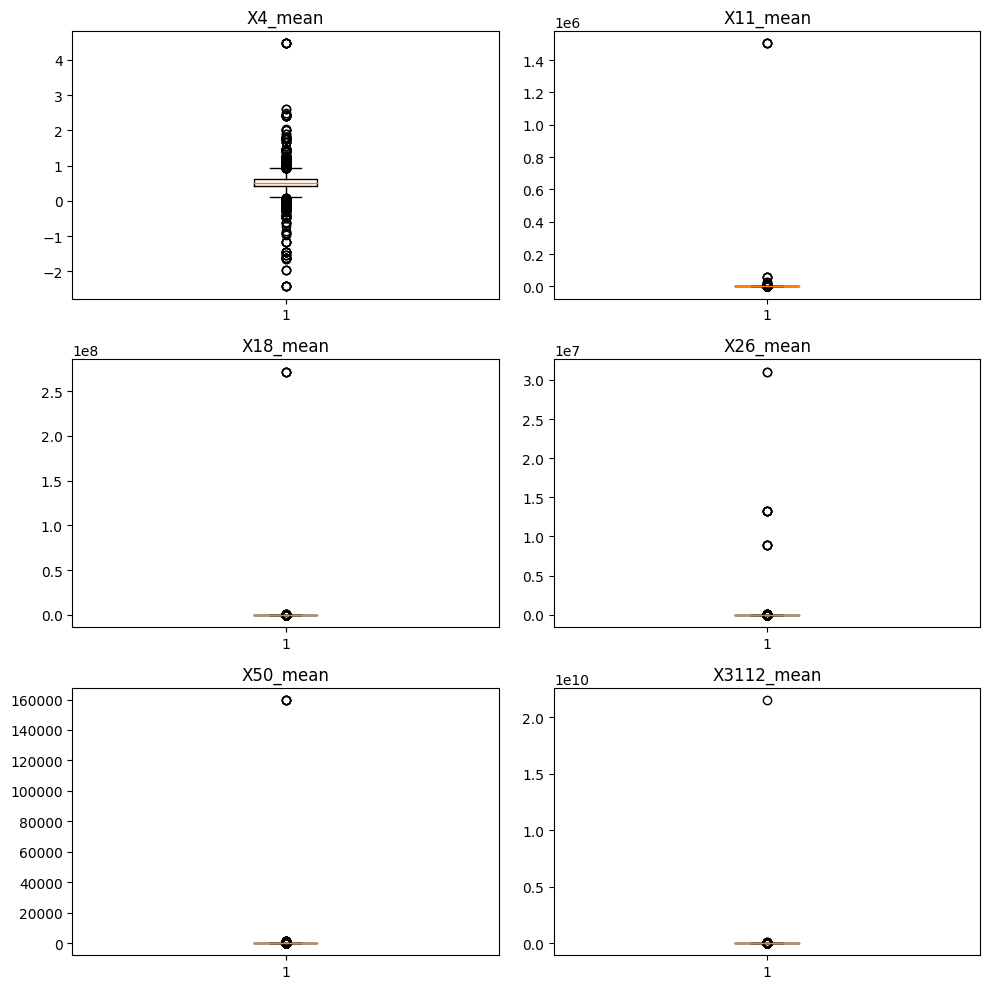

In [ ]:
print("boxplot for origin labels")
plot_outliers(train_df, label_features, 'origin_labels_boxplot')

## Remove Outliers

- train_df_remove_outliers.shape = (54929, 176)


In [ ]:
# use quantiles to erase outliers
train_df_without_outliers = train_df.copy()


In [ ]:
def remove_outliers(df, features):
    quntilelist=np.array(df[features].quantile([0,0.99]))
    IQR=quntilelist[1] - quntilelist[0]
    low_bound=quntilelist[0] - 1.5 * IQR
    upper_bound=quntilelist[1] + 1.5 * IQR

    for i in range(len(features)):
        df[features[i]] = np.where((df[features[i]]<upper_bound[i])&(df[features[i]]>low_bound[i]), df[features[i]],-1)

    for i in range(len(features)):
        df = df[df[features[i]]!=-1]

    return df

In [ ]:
train_df_without_outliers = remove_outliers(train_df_without_outliers, label_features + sd_features)
print("train_df.shape after removal", train_df_without_outliers.shape)

train_df.shape after removal (38581, 176)


In [ ]:
train_df[label_features].describe()

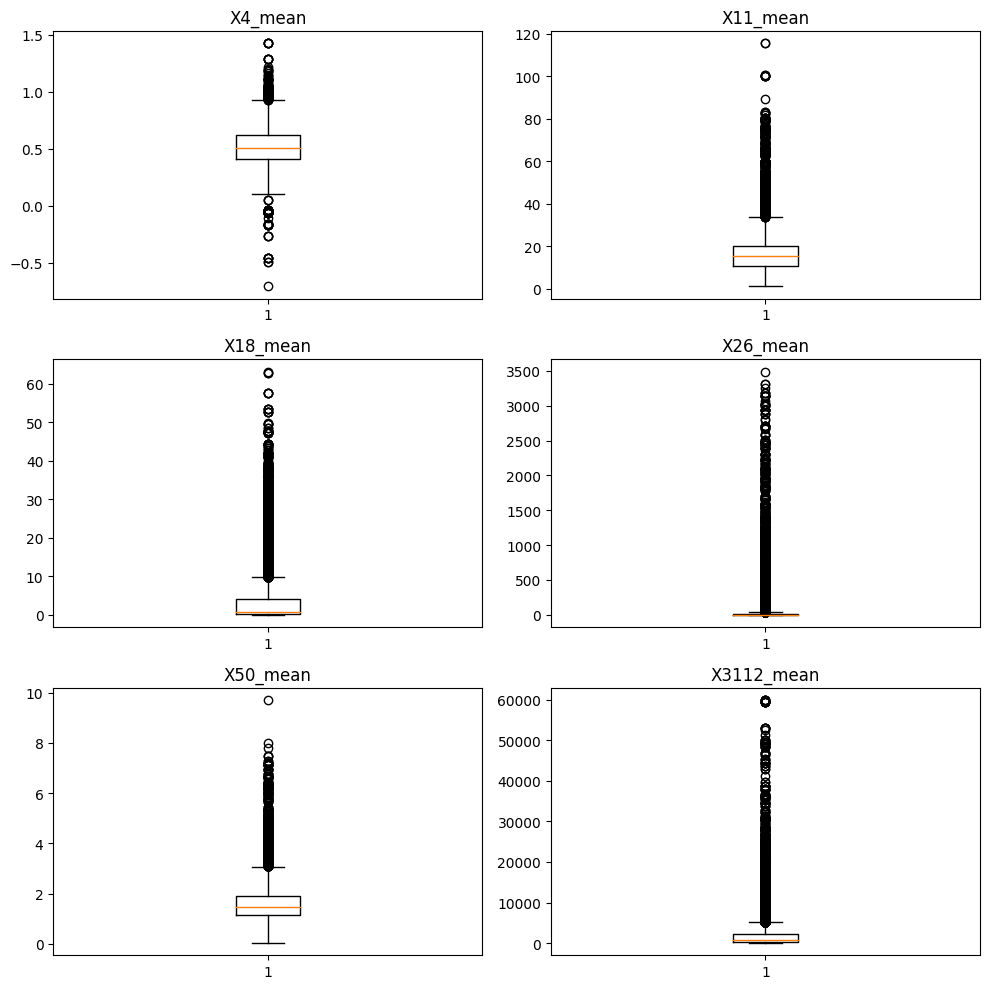

In [ ]:
plot_outliers(train_df_without_outliers, label_features, 'train_df_without_outliers')
pd.to_pickle(train_df, output_image_path + '/train_df_remove_outliers_2labels.pkl')

### The boxplot after removing outliers

## Label Description

In [ ]:
label_meta = pd.read_csv(f'{base_path}/target_name_meta.tsv', delimiter='\t')
label_meta['trait_ID'] = label_meta['trait_ID'] + "_mean"
label_meta.head()


,trait_ID,trait_name
0,X4_mean,Stem specific density (SSD) or wood density (s...
1,X11_mean,Leaf area per leaf dry mass (specific leaf are...
2,X18_mean,Plant height
3,X26_mean,Seed dry mass
4,X50_mean,Leaf nitrogen (N) content per leaf area


In [ ]:
label_meta = label_meta.set_index('trait_ID').squeeze().to_dict()
label_meta


{'X4_mean': 'Stem specific density (SSD) or wood density (stem dry mass per stem fresh volume) ',
 'X11_mean': 'Leaf area per leaf dry mass (specific leaf area, SLA or 1/LMA) ',
 'X18_mean': 'Plant height ',
 'X26_mean': 'Seed dry mass ',
 'X50_mean': 'Leaf nitrogen (N) content per leaf area ',
 'X3112_mean': 'Leaf area (in case of compound leaves: leaf, undefined if petiole in- or excluded) '}

## Image examples

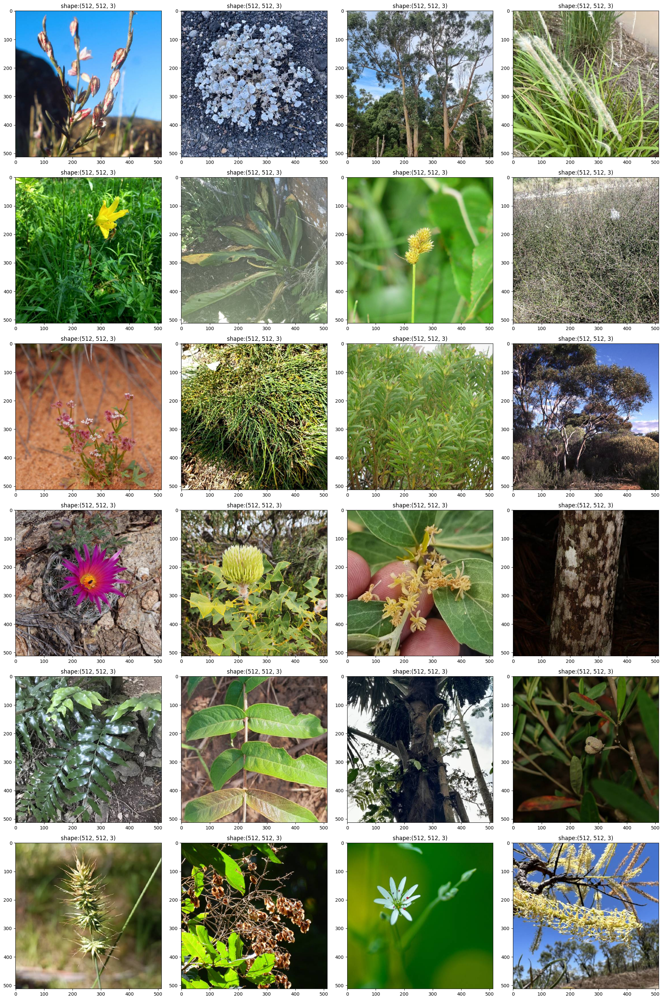

In [ ]:

def plot_image_examples(df, rows, cols):
    fig, ax = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))

    for r in range(rows):
        for c in range(cols):
            idx = r * cols + c
            img = cv2.imread(df.iloc[idx]['id'])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax[r][c].imshow(img)
            format_title = f'shape:{img.shape}'
            ax[r][c].set_title(format_title)

    plt.tight_layout()
    plt.savefig(output_image_path + '/image_examples.png')
    plt.show()

plot_image_examples(train_df, 6, 4)


In [ ]:
def plot_comparison_norm_outliers_images(df, label):

    df_sorted = df.sort_values(by = label, ascending = False)

    # get the highest two pictures
    highest_target = df_sorted.iloc[:2]
    median_target = df_sorted.iloc[int(len(df_sorted)/2) - 1 : int(len(df_sorted)/2) + 1]
    rows_to_plot = pd.concat([highest_target, median_target])

    fig, ax = plt.subplots(1, 4, figsize=(20, 4))
    plt.suptitle(f'{label} | {label_meta[label]}', size=14)

    for ax, (row_idx, row) in zip(ax, rows_to_plot.iterrows()):
        ax.set_title(f'{label}: {row[label]}', size=12)
        ax.imshow(cv2.imread(row['id']))
        ax.axis('off')
    plt.savefig(output_image_path + '/' +f'{label}_normal_outliers'+'.png')
    plt.show()




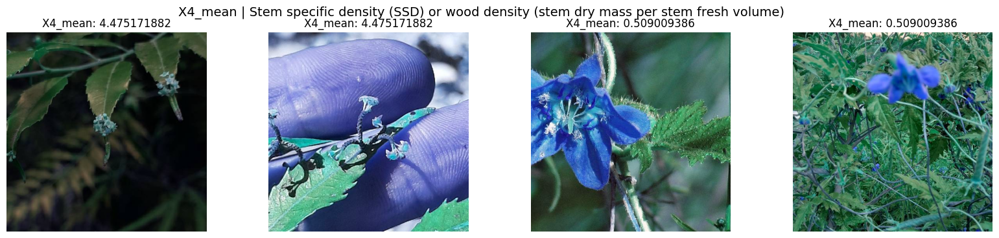

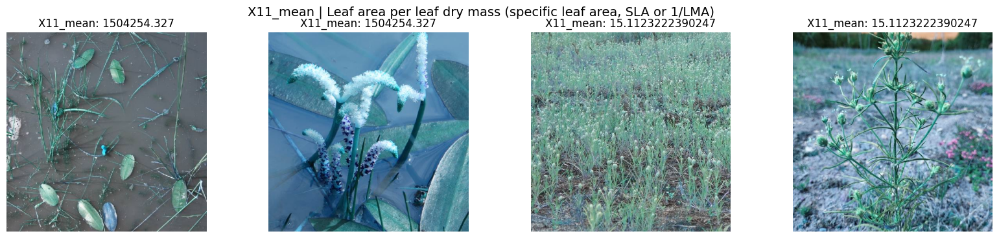

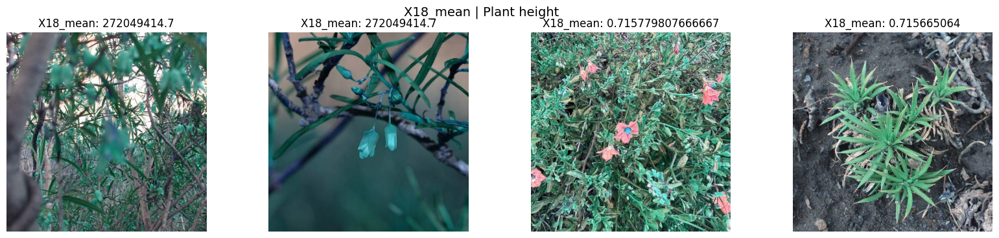

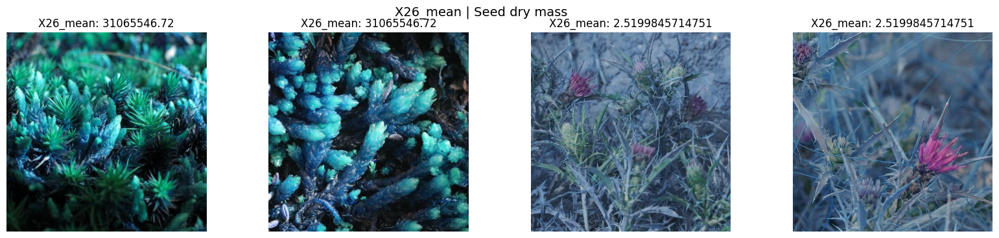

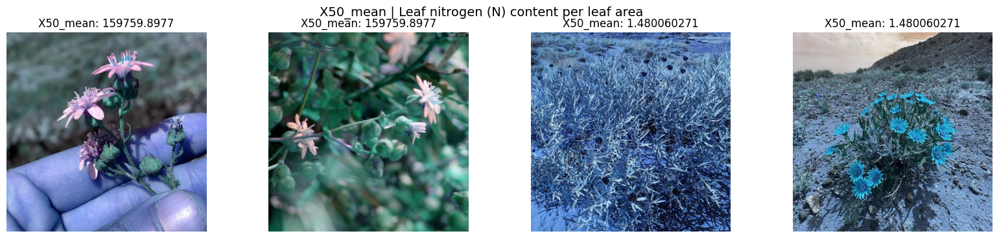

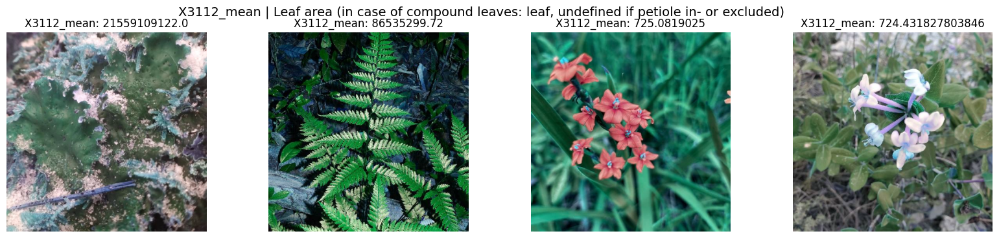

In [ ]:
for label in label_features:
    plot_comparison_norm_outliers_images(train_df, label)

## Label distribution

In [ ]:
def plot_label_distribution(df, df_remove, label_features):
    fig, axes = plt.subplots(len(label_features), 2, figsize=(20, len(label_features)*4))

    v_raw = df[label_features].values
    v_remove = df_remove[label_features].values

    for (ax_raw, ax_norm), target, v_r, v_n in zip(axes, label_features, v_raw.T, v_remove.T):
        # Raw
        ax_raw.hist(v_r, bins=128)
        ax_raw.set_title(f'{target} Raw min: {v_r.min():.3f}, max: {v_r.max():.2e}, µ: {v_r.mean():.2e}, σ: {v_r.std():.2f}', size=10)

        # remove outliers
        ax_norm.hist(v_n, bins=128)
        ax_norm.set_title(f'{target} after removal min: {v_n.min():.3f}, max: {v_n.max():.2f}, µ: {v_n.mean():.2f}, σ: {v_n.std():.2f}', size=10)
    plt.subplots_adjust(hspace=0.25, wspace=0.30)
    plt.savefig(output_image_path + '/label_distribution.png')
    plt.show()


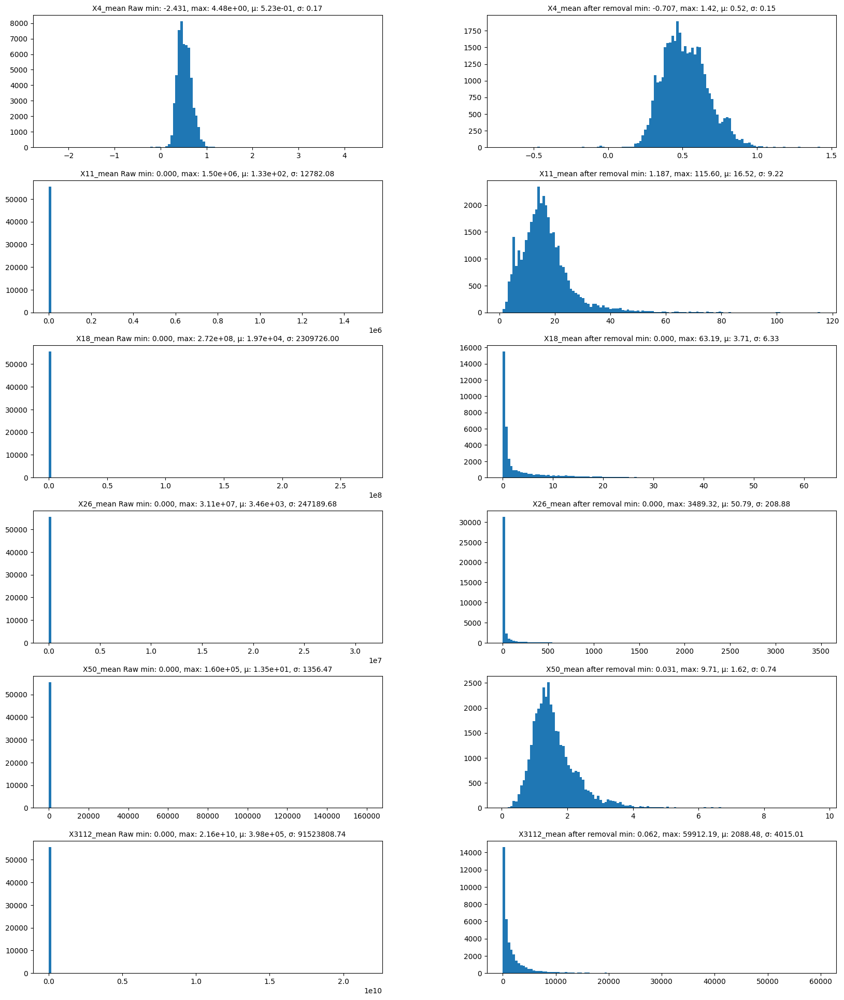

In [ ]:
plot_label_distribution(train_df, train_df_without_outliers, label_features)
